# Import

In [5]:
%matplotlib widget

In [34]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import mne
import scipy
import os

# Plan

Approche d'un dataset EEG avec MNE :

  * 1) Manipulation raw object : sauvegarde / chargement
  * 2) Visualisation des données
  * 3) Preprocessing : filtrage / ICA
  * 4) Analyses : ERP / TF

(pour un tuto sur MNE tutoriel : https://mne.tools/stable/auto_tutorials/evoked/30_eeg_erp.html)


# 1) Manipulation raw object

## protocole

* 20min de signal
* stimuli visuel A, B
* 1 trial : 500ms (croix de fixation) / 500ms (stim) / 1500-2000ms (washout)
* 400 trials
* 21 chans, 250Hz, ref FCz

## params

In [8]:
debug = False

# Définition des paramètres
n_channels = 21  # Nombre de canaux EEG
sampling_rate = 250  # Fréquence d'échantillonnage en Hz
duration = 20 * 60  # Durée de l'enregistrement en secondes
n_samples = sampling_rate * duration  # Nombre total d'échantillons
n_triggers = 400  # Nombre total de triggers

# Définition desfreqs canaux EEG
channels = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'A1', 'A2', 'T3', 'C3', 'Cz', 'C4', 'T4', 'T5', 'P3', 'Pz', 'P4', 'T6', 'O1', 'O2']

n_perm = 250

## simulation

In [49]:

def pink_noise(n_samples, n_channels):

    freqs = np.fft.rfftfreq(n_samples, d=1/sampling_rate) # on génère le vecteur des fréquences
    amplitudes = 1 / (freqs + 1e-10)  # le 1/f pour les amplitudes
    phases = np.random.uniform(0, 2*np.pi, (n_channels, len(freqs))) # les phases aléatoire pour les coefficients de fourier
    spectrum = amplitudes * (np.cos(phases) + 1j * np.sin(phases)) # génération du spectre de fréquence
    noise = np.fft.irfft(spectrum, n_samples) # inverse fft pour récupérer le signal en réel
    noise = scipy.stats.zscore(noise, axis=1) * 1e-6 # Normalisation des données pour avoir des micro volts
    
    if debug:

        plt.plot(freqs)
        plt.show()

        plt.plot(amplitudes)
        plt.show()

        plt.plot(noise[0,:])
        plt.show()

    return noise


def generate_data_set():

    # Génération de la matrice EEG avec du bruit rose
    EEG_data = pink_noise(n_samples, n_channels)

    # Ajout d'un signal 50 Hz avec une certaine amplitude
    f_noise = 50  # Fréquence de l'interférence
    amplitude_50hz = EEG_data.std()/100  # Niveau de l'interférence

    time = np.arange(n_samples) / sampling_rate
    interference = amplitude_50hz * np.sin(2 * np.pi * f_noise * time)

    if debug:

        plt.plot(interference)
        plt.show()

        plot_PSD(interference)

    EEG_data += interference

    if debug:

        plt.plot(EEG_data[0,:sampling_rate*5])
        plt.show()

        plot_PSD(EEG_data[0,:])

    # Génération du vecteur de triggers
    trigger_vector = np.zeros(n_samples)  # Initialisation avec des zéros

    # Génération des indices des triggers (espacés entre 2.5s et 3s)
    trigger_times = np.cumsum(np.random.uniform(2.5, 3, n_triggers))  
    trig_idxs = np.round(trigger_times * sampling_rate).astype(int)  # Conversion en indices

    # Séparation en deux types de triggers
    types = np.concatenate([np.ones((int(len(trig_idxs)/2))), np.ones((int(len(trig_idxs)/2)))+1])
    np.random.shuffle(types)
    trigger_vector[trig_idxs] = types
    trig_type = trigger_vector[trigger_vector != 0]

    # Génération des blinks
    blink_amplitude = 1
    blink_duration = 0.5  # s
    blink_samples = int(blink_duration * sampling_rate)
    blink_waveform = np.exp(-np.linspace(-2, 2, blink_samples)**2)
    blink_weights = np.array([1.0 if ch in ['Fp1', 'Fp2', 'F3', 'F4'] else 0.1 for ch in channels])

    blink_times = np.cumsum(np.random.uniform(0, 12, int(n_triggers/2)))  # Temps des blinks
    blink_idxs = np.round(blink_times * sampling_rate).astype(int)

    blink_sig = np.zeros((n_samples))

    for idx in blink_idxs:
        if idx + blink_samples < n_samples:
            blink_sig[idx:idx + blink_samples] = blink_waveform * blink_amplitude

    blink_sig *= EEG_data.std() # on scale le signal, plus important que pour le reste

    if debug:

        plt.plot(blink_sig)
        plt.show()

    # On ajoute le signal
    for ch_i, ch in enumerate(channels):

        EEG_data[ch_i,:] += blink_sig * blink_weights[ch_i]

    if debug:

        plt.plot(EEG_data[0,:])
        plt.show()

        plt.plot(EEG_data[-1,:])
        plt.show()

    # Génération des activités P1 et N1
    p1_amplitude = 0.5
    n1_amplitude = -0.4
    erp_duration = 0.1  # 100 ms
    p1_samples = n1_samples = int(erp_duration * sampling_rate)

    p1_waveform = p1_amplitude * np.exp(-np.linspace(-2, 2, p1_samples)**2)
    n1_waveform = n1_amplitude * np.exp(-np.linspace(-2, 2, n1_samples)**2)

    if debug:

        plt.plot(p1_waveform)
        plt.show()

        plt.plot(n1_waveform)
        plt.show()

    erp_weights = np.array([1.0 if ch in ['O1', 'O2'] else 0.7 if ch in ['T5', 'P3', 'Pz', 'P4', 'T6'] else 0 for ch in channels])

    erp_sig = np.zeros((n_samples))

    for idx, t in zip(trig_idxs, types):
        factor = 1 if t == 1 else 0.5  # Réduction de l'amplitude pour trigger 2
        p1_idx = idx + int(0.1 * sampling_rate)  # 600ms après trigger
        n1_idx = idx + int(0.2 * sampling_rate)  # 700ms après trigger
        if p1_idx + p1_samples < n_samples:
            erp_sig[p1_idx:p1_idx + p1_samples] = p1_waveform * factor
        if n1_idx + n1_samples < n_samples:
            erp_sig[n1_idx:n1_idx + n1_samples] = n1_waveform * factor

    erp_sig *= EEG_data.std()/5 # on scale le signal

    if debug:

        plt.plot(erp_sig)
        plt.show()

    # On ajoute le signal
    for ch_i, ch in enumerate(channels):

        EEG_data[ch_i,:] += erp_sig * erp_weights[ch_i]

    if debug:

        plt.plot(EEG_data[0,:])
        plt.show()

    # Génération des activités Theta et Gamma
    theta_duration = 0.750  # 500 ms
    gamma_duration = 0.300  # 150 ms
    theta_samples = int(theta_duration * sampling_rate)
    gamma_samples = int(gamma_duration * sampling_rate)
    theta_freq = 6  # Fréquence centrale de l'onde Theta
    gamma_freq = 80  # Fréquence centrale de l'onde Gamma

    theta_waveform = np.exp(-np.linspace(-2, 2, theta_samples)**2) * np.sin(2 * np.pi * theta_freq * np.linspace(0, theta_duration, theta_samples))
    gamma_waveform = np.exp(-np.linspace(-2, 2, gamma_samples)**2) * np.sin(2 * np.pi * gamma_freq * np.linspace(0, gamma_duration, gamma_samples))

    jitter = 0.15*sampling_rate

    # Gamma
    freq_weights = np.array([1.0 if ch in ['O1', 'O2'] else 0.0 for ch in channels])

    freq_sig = np.zeros((n_samples))

    jitter_list = np.array([np.random.randint(low=trig_i-jitter, high=trig_i+jitter, size=1)[0] for trig_i in trig_idxs])

    for idx, t in zip(jitter_list, types):
        factor = 1 if t == 1 else 0.5  # Réduction de l'amplitude pour trigger 2
        gamma_idx = idx + int(0.1 * sampling_rate)  # 500ms après trigger
        if gamma_idx + gamma_samples < n_samples:
            freq_sig[gamma_idx:gamma_idx + gamma_samples] = gamma_waveform * factor

    freq_sig *= EEG_data.std()/50 # on scale le signal

    if debug:

        plt.plot(freq_sig)
        plt.show()

    for ch_i, ch in enumerate(channels):

        EEG_data[ch_i,:] += freq_sig * freq_weights[ch_i]

    # Theta
    freq_sig = np.zeros((n_samples))

    freq_weights = np.array([1.0 if ch in ['Fp1', 'Fp2', 'Fz', 'F3', 'F4', 'O1', 'O2'] else 0.0 for ch in channels])

    jitter_list = np.array([np.random.randint(low=trig_i-jitter, high=trig_i+jitter, size=1)[0] for trig_i in trig_idxs])

    for idx, t in zip(jitter_list, types):
        factor = 1 if t == 1 else 0.5  # Réduction de l'amplitude pour trigger 2
        theta_idx = idx + int(0.2 * sampling_rate)  # 600ms après trigger
        if theta_idx + theta_samples < n_samples:
            freq_sig[theta_idx:theta_idx + theta_samples] = theta_waveform * factor

    freq_sig *= EEG_data.std()/10 # on scale le signal

    if debug:

        plt.plot(freq_sig)
        plt.show()

    # On ajoute le signal
    for ch_i, ch in enumerate(channels):

        EEG_data[ch_i,:] += freq_sig * freq_weights[ch_i]

    trig_idxs = trig_idxs.astype('int')
    trig_type = trig_type.astype('int')

    if debug:

        plt.plot(EEG_data[-1,:])
        plt.show()

    return EEG_data, trig_idxs, trig_type




def plot_PSD(x):

    hzPxx, Pxx = scipy.signal.welch(x, fs=sampling_rate, window='hann', nperseg=sampling_rate*20, noverlap=sampling_rate*20/2, nfft=None)
    plt.figure()
    plt.plot(hzPxx, Pxx)
    plt.yscale('log')
    plt.show()

# to compare during preprocessing
#data_pre, data_post, srate, chan_name = EEG_data, raw.get_data(), sampling_rate, 'Fp1'
def compare_pre_post(data_pre, data_post, srate, chan_name):

    # compare before after
    nchan_i = channels.index(chan_name)
    x_pre = data_pre[nchan_i,:]
    x_post = data_post[nchan_i,:]
    time = np.arange(x_pre.shape[0]) / srate

    nwind = int(10*srate)
    nfft = nwind
    noverlap = np.round(nwind/2)
    hannw = scipy.signal.windows.hann(nwind)

    hzPxx, Pxx_pre = scipy.signal.welch(x_pre,fs=srate,window=hannw,nperseg=nwind,noverlap=noverlap,nfft=nfft)
    hzPxx, Pxx_post = scipy.signal.welch(x_post,fs=srate,window=hannw,nperseg=nwind,noverlap=noverlap,nfft=nfft)

    plt.figure()
    plt.plot(time, x_pre, label='x_pre')
    plt.plot(time, x_post, label='x_post')
    plt.title(chan_name)
    plt.legend()
    plt.show()

    plt.figure()
    plt.semilogy(hzPxx, Pxx_pre, label='Pxx_pre')
    plt.semilogy(hzPxx, Pxx_post, label='Pxx_post')
    plt.title(chan_name)
    plt.legend()
    # plt.xlim(60,360)
    plt.show()



## export data

In [38]:
EEG_data, trig_idxs, trig_type = generate_data_set()

# info object
ch_types = ['eeg'] * len(channels)
info = mne.create_info(ch_names=channels, sfreq=sampling_rate, ch_types=ch_types)
info.set_montage('standard_1020')

# raw object
raw = mne.io.RawArray(EEG_data, info)

# events object
events = np.column_stack((trig_idxs,np.zeros(len(trig_idxs), dtype=int),trig_type)).astype(int)
event_dict = {1: 'Stimulus/1', 2: 'Stimulus/2'}
annotations = mne.annotations_from_events(events, sfreq=sampling_rate, event_desc=event_dict)
raw.set_annotations(annotations)

# save to .fif
exportpath = os.path.join(os.getcwd(), "eeg_data_raw.fif")
raw.save(exportpath, overwrite=True)


Creating RawArray with float64 data, n_channels=21, n_times=300000
    Range : 0 ... 299999 =      0.000 ...  1199.996 secs
Ready.
Overwriting existing file.
Writing c:\Users\jules\Downloads\eeg_data_raw.fif
Closing c:\Users\jules\Downloads\eeg_data_raw.fif
[done]


[WindowsPath('c:/Users/jules/Downloads/eeg_data_raw.fif')]

## load data

In [39]:
importpath = os.path.join(os.getcwd(), "eeg_data_raw.fif")
raw = mne.io.read_raw_fif(importpath, preload=True)


Opening raw data file c:\Users\jules\Downloads\eeg_data_raw.fif...
    Range : 0 ... 299999 =      0.000 ...  1199.996 secs
Ready.
Reading 0 ... 299999  =      0.000 ...  1199.996 secs...


# 2) Visualize data

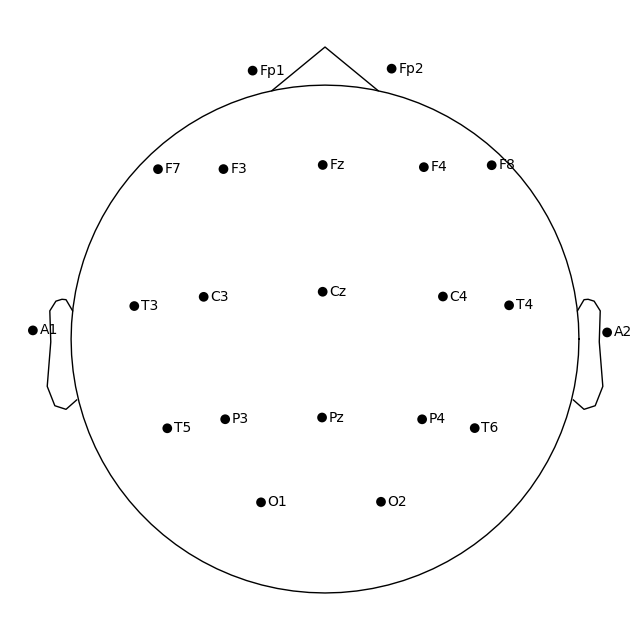

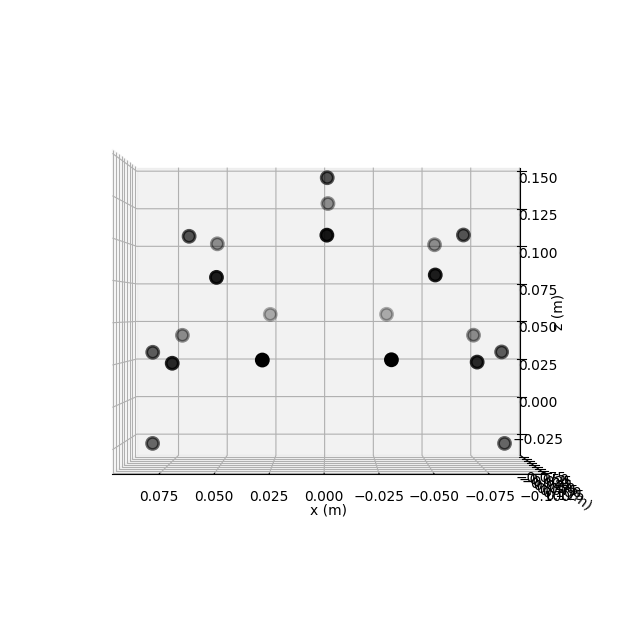

In [40]:
#Channel locations
raw.plot_sensors(show_names=True)
fig = raw.plot_sensors("3d")

In [46]:
events, event_id = mne.events_from_annotations(raw)
print(events)
print(event_id)

Used Annotations descriptions: [np.str_('Stimulus/1'), np.str_('Stimulus/2')]
[[   661      0      1]
 [  1403      0      2]
 [  2089      0      2]
 ...
 [273469      0      2]
 [274141      0      2]
 [274867      0      1]]
{np.str_('Stimulus/1'): 1, np.str_('Stimulus/2'): 2}


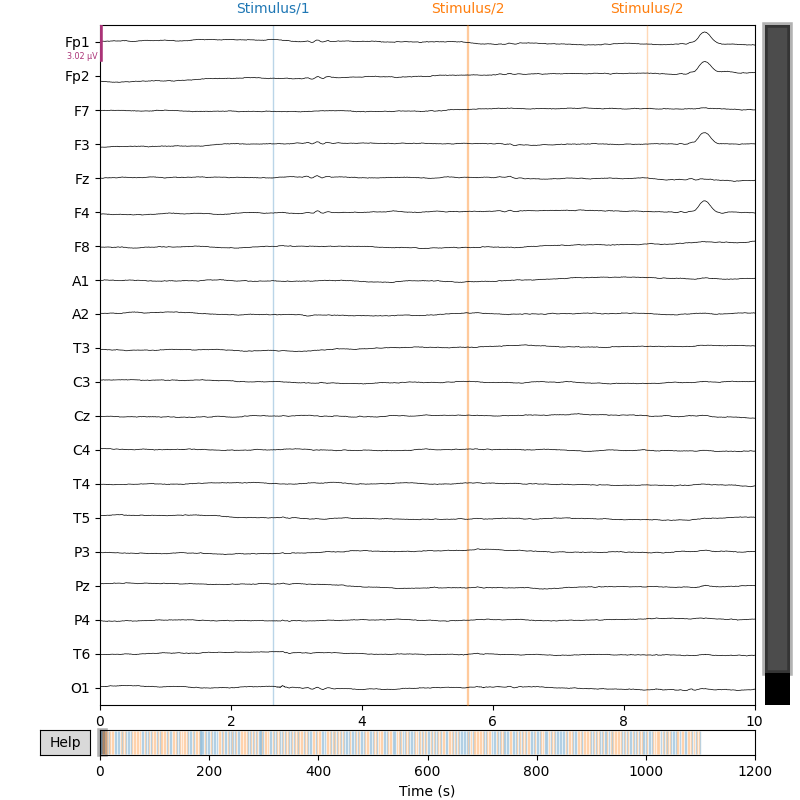

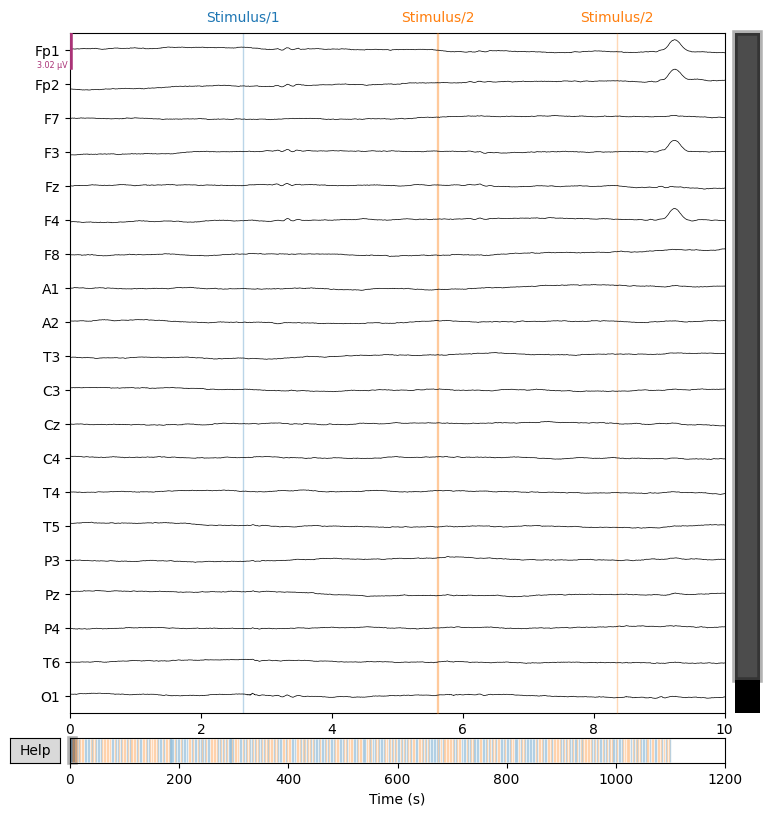

In [47]:
raw.plot(title="EEG with Annotations", duration=10, n_channels=20, scalings='auto')

# 3) Preprocessing

## filter >1Hz + notch 50Hz

In [48]:
raw.filter(l_freq=1, h_freq=None)  # Filtre passe-haut (1 Hz pour supprimer la dérive)

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 825 samples (3.300 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


<Raw | eeg_data_raw.fif, 21 x 300000 (1200.0 s), ~48.1 MiB, data loaded>

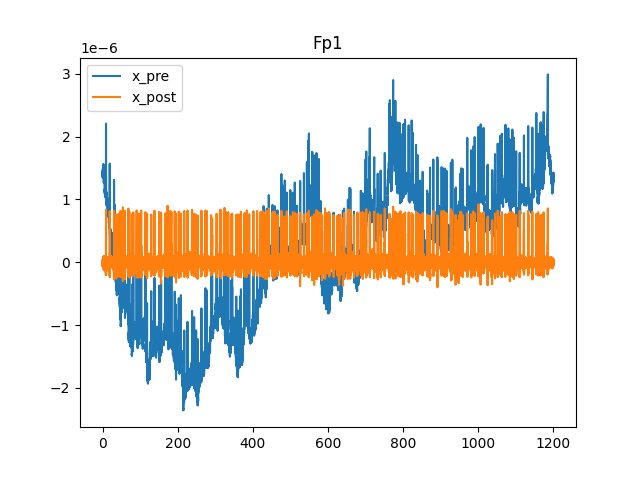

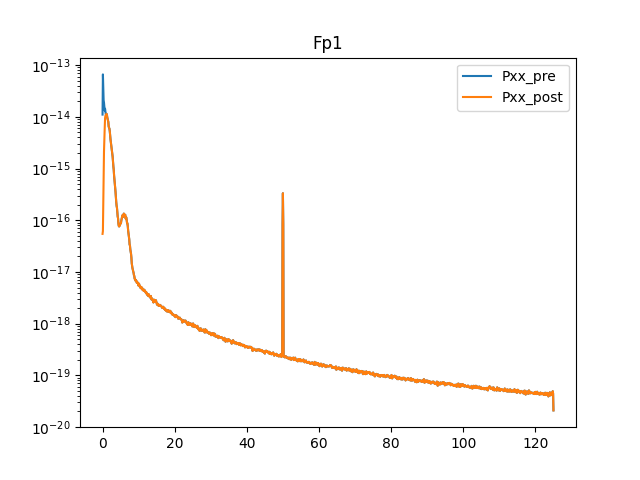

In [50]:
compare_pre_post(data_pre=EEG_data, data_post=raw.get_data(), srate=sampling_rate, chan_name='Fp1')
data_filter = raw.get_data()

In [ ]:
raw.notch_filter(freqs=[50], notch_widths=1)  # Filtre Notch pour le 50 Hz

Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 1651 samples (6.604 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


<Raw | eeg_data_raw.fif, 21 x 300000 (1200.0 s), ~48.1 MiB, data loaded>

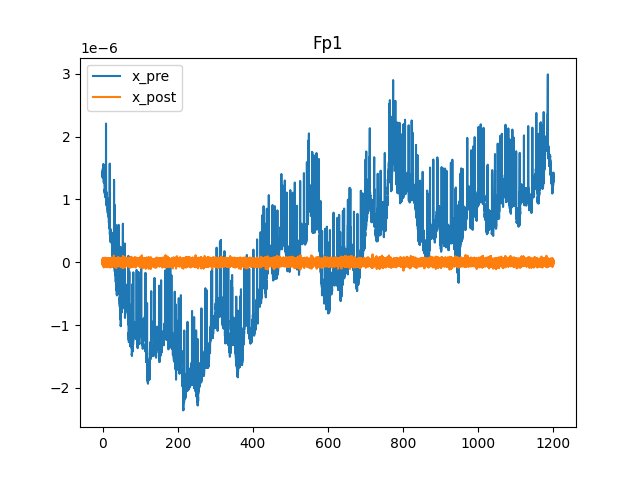

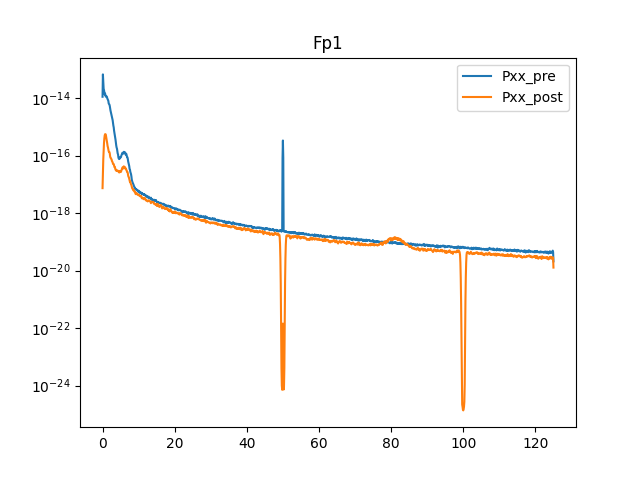

In [70]:
compare_pre_post(data_pre=EEG_data, data_post=raw.get_data(), srate=sampling_rate, chan_name='Fp1')
data_filter = raw.get_data()

## ICA

Fitting ICA to data using 21 channels (please be patient, this may take a while)
Selecting by number: 10 components
Fitting ICA took 3.7s.
Creating RawArray with float64 data, n_channels=10, n_times=300000
    Range : 0 ... 299999 =      0.000 ...  1199.996 secs
Ready.


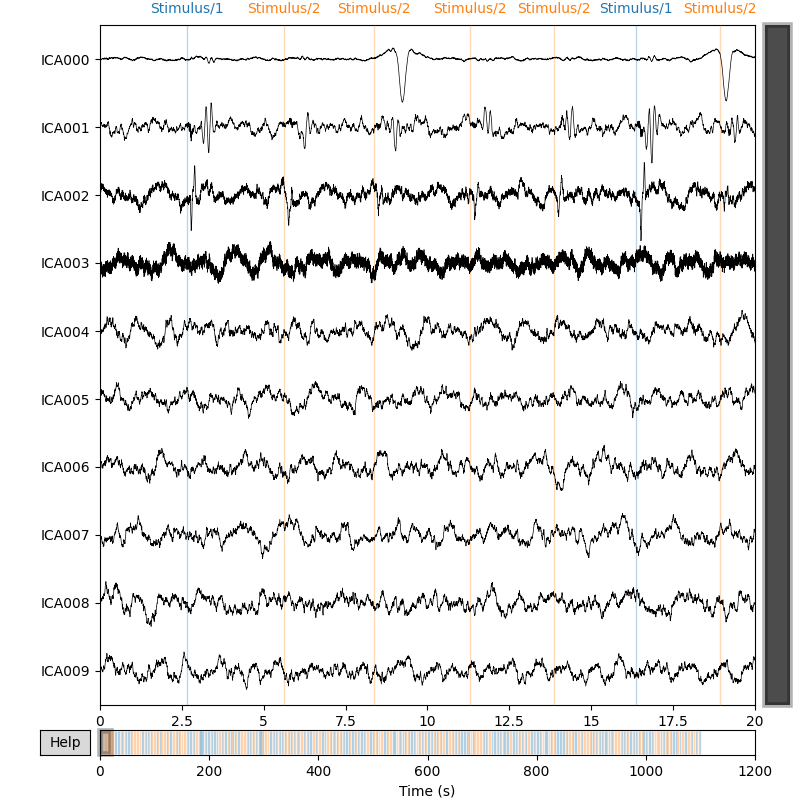

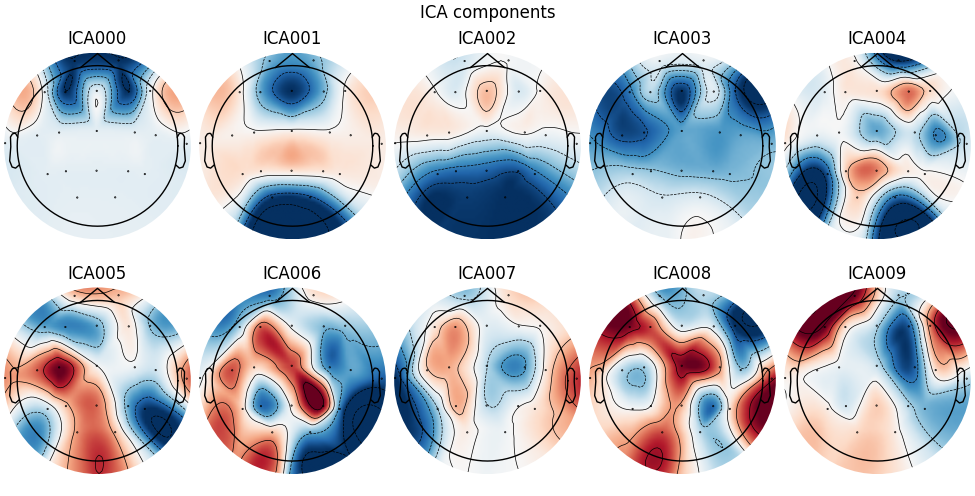

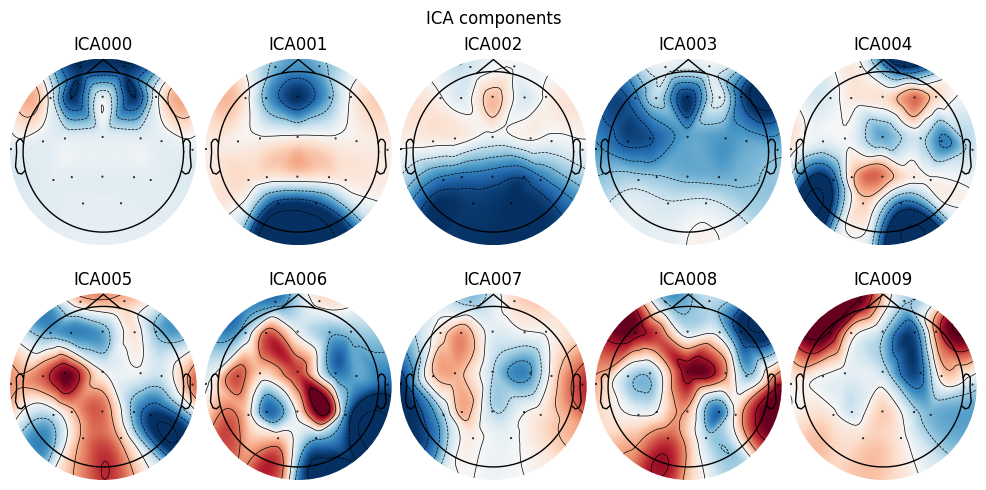

In [51]:
ica = mne.preprocessing.ICA(n_components=10, random_state=42, method="fastica")
ica.fit(raw)

ica.plot_sources(raw)
ica.plot_components()

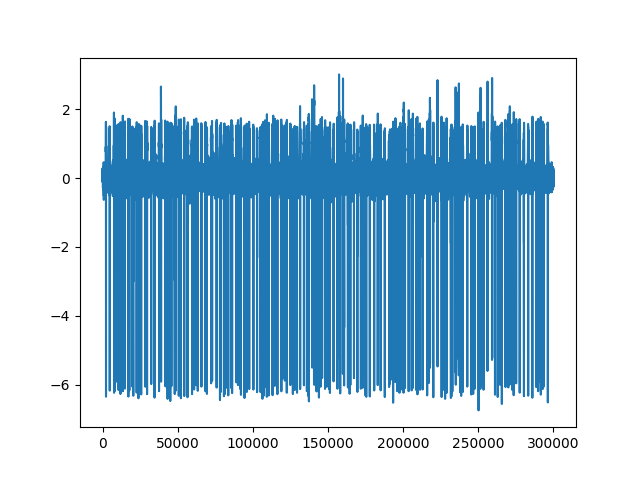

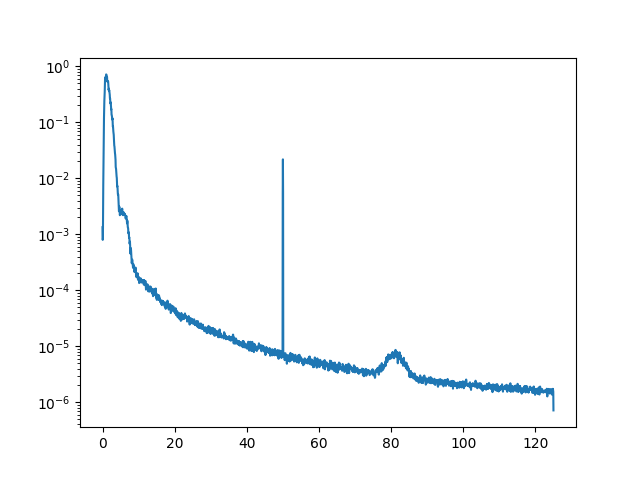

In [53]:
bad_comps = ica.exclude

# Extraire le signal des composantes rejetées
sources = ica.get_sources(raw)
rejected_signals = sources.get_data()[bad_comps, :].reshape(-1)

plt.figure()
plt.plot(rejected_signals)
plt.show()

plot_PSD(rejected_signals)

In [54]:
ica.apply(raw) # exclude component

Applying ICA to Raw instance
    Transforming to ICA space (10 components)
    Zeroing out 1 ICA component
    Projecting back using 21 PCA components


<Raw | eeg_data_raw.fif, 21 x 300000 (1200.0 s), ~48.1 MiB, data loaded>

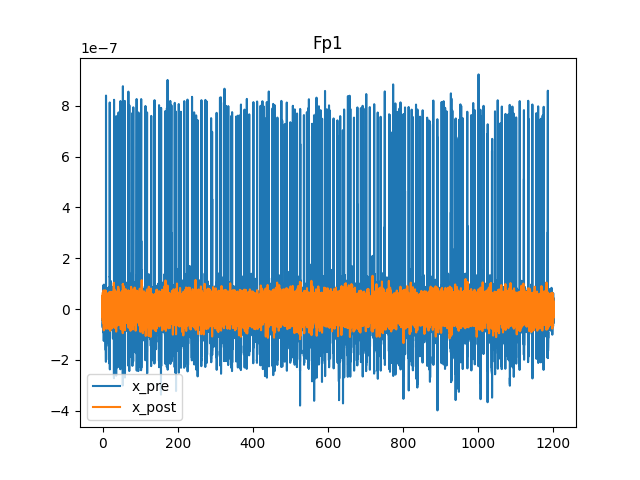

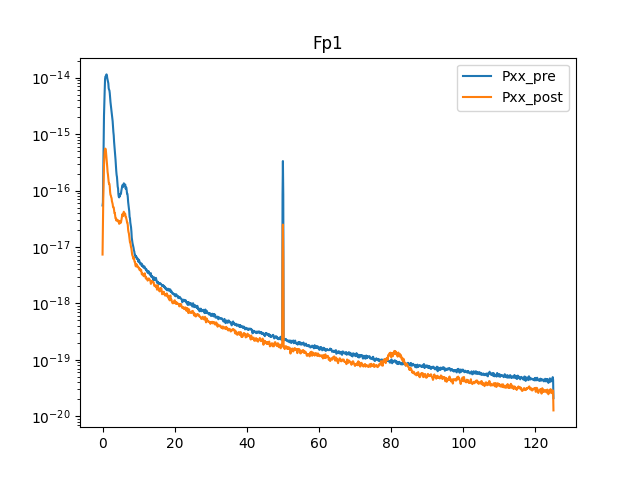

In [55]:
compare_pre_post(data_pre=data_filter, data_post=raw.get_data(), srate=sampling_rate, chan_name='Fp1')


# 4) Analyses

## ERP

Used Annotations descriptions: [np.str_('Stimulus/1'), np.str_('Stimulus/2')]
Not setting metadata
400 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 400 events and 501 original time points ...
0 bad epochs dropped


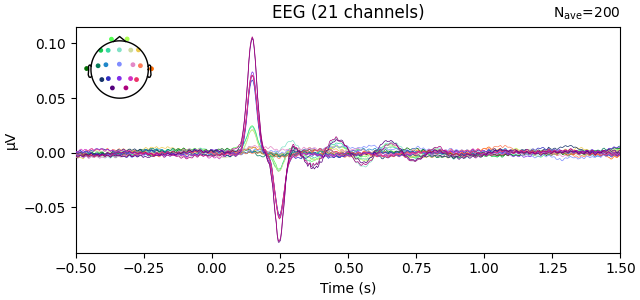

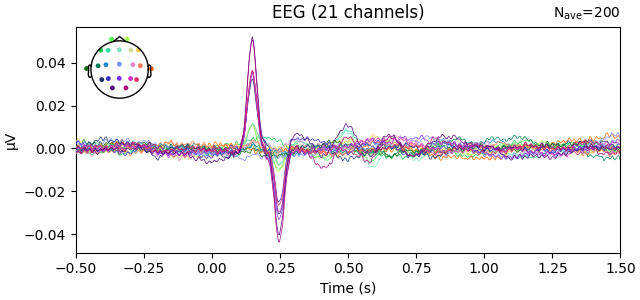

In [60]:
epochs = mne.Epochs(raw, tmin=-0.5, tmax=1.5, baseline=None, detrend=1, preload=True)
erp_1 = epochs["1"].average()
erp_2 = epochs["2"].average()

fig1 = erp_1.plot(window_title = "1")
fig2 = erp_2.plot(spatial_colors=True, window_title = "2")


No projector specified for this dataset. Please consider the method self.add_proj.


c:\venv\py313\Lib\site-packages\mne\viz\utils.py:1437: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize, layout="constrained")


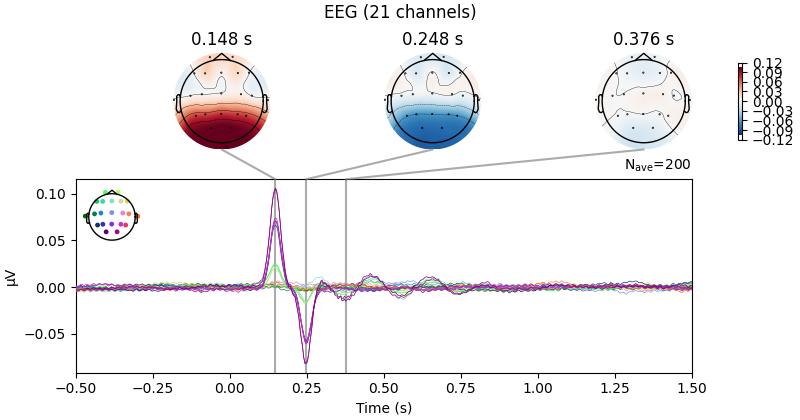

No projector specified for this dataset. Please consider the method self.add_proj.


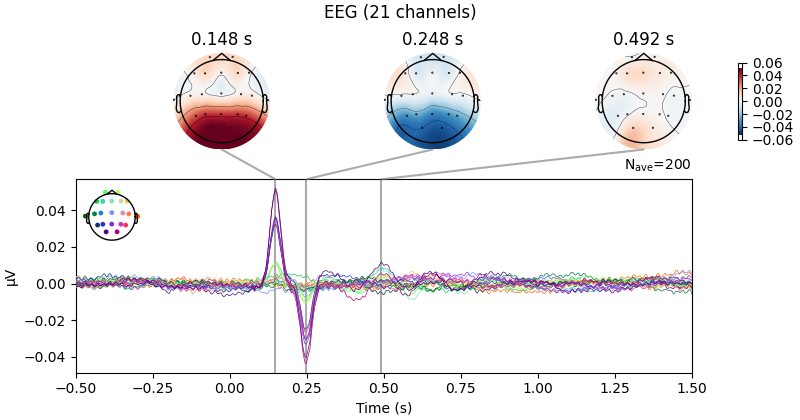

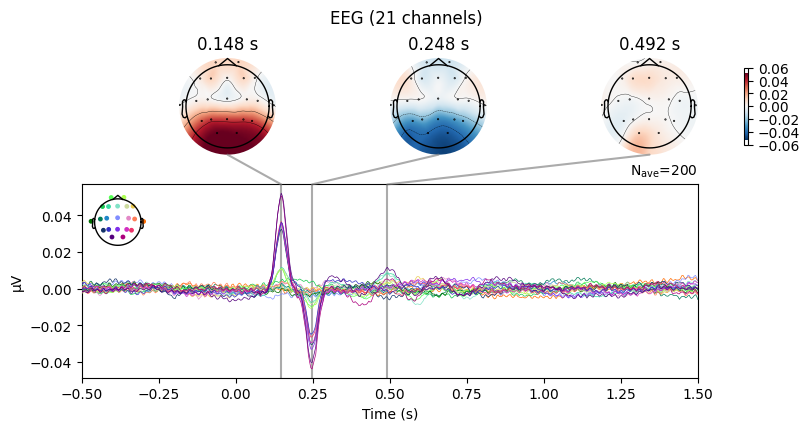

In [62]:
erp_1.plot_joint()
erp_2.plot_joint()

### stats

In [64]:
# Analyse statistique : Test de permutation cluster
perm_stats = {}
for ch_i, ch in enumerate(channels):

    perm_stats[ch] = mne.stats.permutation_cluster_1samp_test(epochs["1"].get_data()[:,ch_i,:]-epochs["2"].get_data()[:,ch_i,:], n_permutations=n_perm, 
                                                        tail=1, n_jobs=None, out_type="mask", threshold=8) # T_obs, clusters, cluster_p_values, H0   

stats_vec = np.zeros((len(channels), erp_1.times.size), dtype='bool')
for ch_i, ch in enumerate(channels):
    for c_i, c in enumerate(perm_stats[ch][1]):
        stats_vec[ch_i,c[0].start:c[0].stop] = True

stat_fun(H1): min=-2.466908051058189 max=4.942391332362884
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=-2.1295565587501852 max=3.5193593089489665
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=-2.2576027158613607 max=1.917846723091457
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=-3.388450196849918 max=4.537797511094091
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=-2.9526135541995964 max=3.9768881448222744
Running initial clustering …
Found 0 clusters


C:\Users\jules\AppData\Local\Temp\ipykernel_22752\331377413.py:5: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  perm_stats[ch] = mne.stats.permutation_cluster_1samp_test(epochs["1"].get_data()[:,ch_i,:]-epochs["2"].get_data()[:,ch_i,:], n_permutations=n_perm,
C:\Users\jules\AppData\Local\Temp\ipykernel_22752\331377413.py:5: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  perm_stats[ch] = mne.stats.permutation_cluster_1samp_test(epochs["1"].get_data()[:,ch_i,:]-epochs["2"].get_data()[:,ch_i,:], n_permutations=n_perm,
C:\Users\jules\AppData\Local\Temp\ipykernel_22752\331377413.py:5: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  perm_stats[ch] = mne.stats.permutation_cluster_1samp_test(epochs["1"].get_data()[:,ch_i,:]-epochs["2"].get_data()[:,ch_i,:], n_permutations=n_perm,
C:\Users\jules\AppData\Local\Temp\ipykernel_22752\331377413.py:5: RuntimeWarning: No clusters found, returning e

stat_fun(H1): min=-3.1086306607327705 max=4.103025406682977
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=-3.1165158368840307 max=3.362970149468092
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=-2.8447281901541914 max=2.199396830713691
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=-3.8204268063383657 max=3.541466181003404
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=-3.511649940433953 max=3.3753867286071166
Running initial clustering …
Found 0 clusters


C:\Users\jules\AppData\Local\Temp\ipykernel_22752\331377413.py:5: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  perm_stats[ch] = mne.stats.permutation_cluster_1samp_test(epochs["1"].get_data()[:,ch_i,:]-epochs["2"].get_data()[:,ch_i,:], n_permutations=n_perm,
C:\Users\jules\AppData\Local\Temp\ipykernel_22752\331377413.py:5: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  perm_stats[ch] = mne.stats.permutation_cluster_1samp_test(epochs["1"].get_data()[:,ch_i,:]-epochs["2"].get_data()[:,ch_i,:], n_permutations=n_perm,
C:\Users\jules\AppData\Local\Temp\ipykernel_22752\331377413.py:5: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  perm_stats[ch] = mne.stats.permutation_cluster_1samp_test(epochs["1"].get_data()[:,ch_i,:]-epochs["2"].get_data()[:,ch_i,:], n_permutations=n_perm,
C:\Users\jules\AppData\Local\Temp\ipykernel_22752\331377413.py:5: RuntimeWarning: No clusters found, returning e

stat_fun(H1): min=-2.0067101950819484 max=2.4145495984748586
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=-3.737176246655813 max=2.785820839006982
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=-2.767563774717743 max=2.940818147996921
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=-2.1306868989860335 max=2.339411692762784
Running initial clustering …
Found 0 clusters
stat_fun(H1): min=-8.91568099048322 max=12.574635081681969
Running initial clustering …
Found 1 cluster


C:\Users\jules\AppData\Local\Temp\ipykernel_22752\331377413.py:5: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  perm_stats[ch] = mne.stats.permutation_cluster_1samp_test(epochs["1"].get_data()[:,ch_i,:]-epochs["2"].get_data()[:,ch_i,:], n_permutations=n_perm,
C:\Users\jules\AppData\Local\Temp\ipykernel_22752\331377413.py:5: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  perm_stats[ch] = mne.stats.permutation_cluster_1samp_test(epochs["1"].get_data()[:,ch_i,:]-epochs["2"].get_data()[:,ch_i,:], n_permutations=n_perm,
C:\Users\jules\AppData\Local\Temp\ipykernel_22752\331377413.py:5: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  perm_stats[ch] = mne.stats.permutation_cluster_1samp_test(epochs["1"].get_data()[:,ch_i,:]-epochs["2"].get_data()[:,ch_i,:], n_permutations=n_perm,
C:\Users\jules\AppData\Local\Temp\ipykernel_22752\331377413.py:5: RuntimeWarning: No clusters found, returning e

  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

stat_fun(H1): min=-11.203162888584965 max=10.706833912600082
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

stat_fun(H1): min=-8.095551813591175 max=12.71880164238283
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

stat_fun(H1): min=-9.344443418239846 max=12.62935808473414
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

stat_fun(H1): min=-11.255204063262438 max=12.349173005227192
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

stat_fun(H1): min=-12.093914861862945 max=16.355224761854686
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

stat_fun(H1): min=-10.673466710995417 max=17.241224298767296
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

### plot

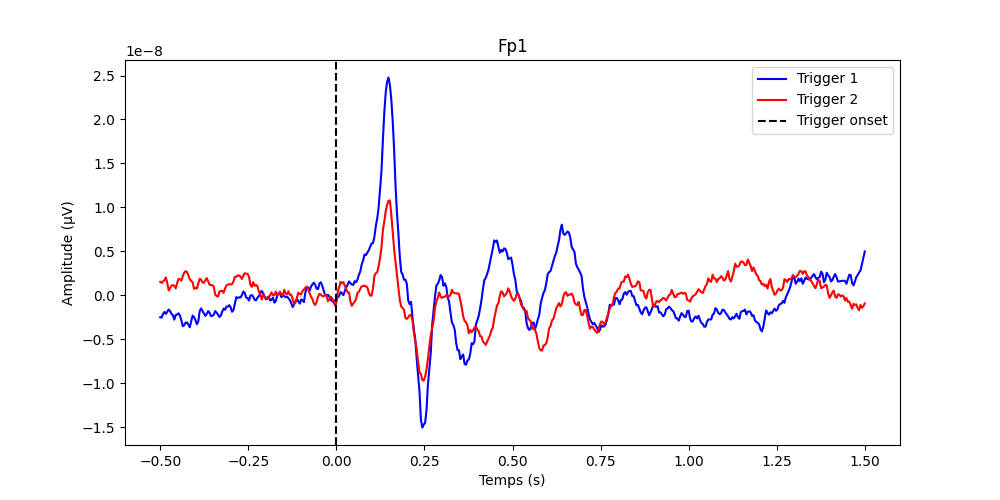

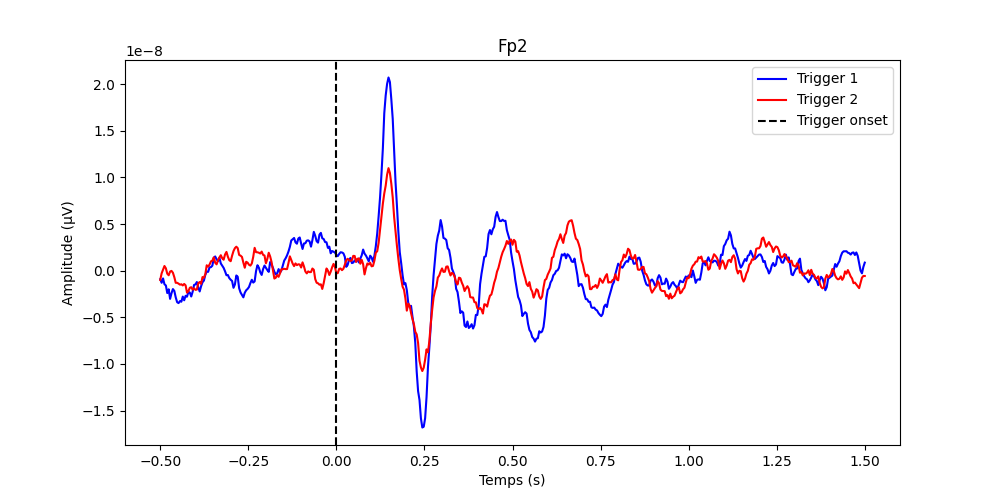

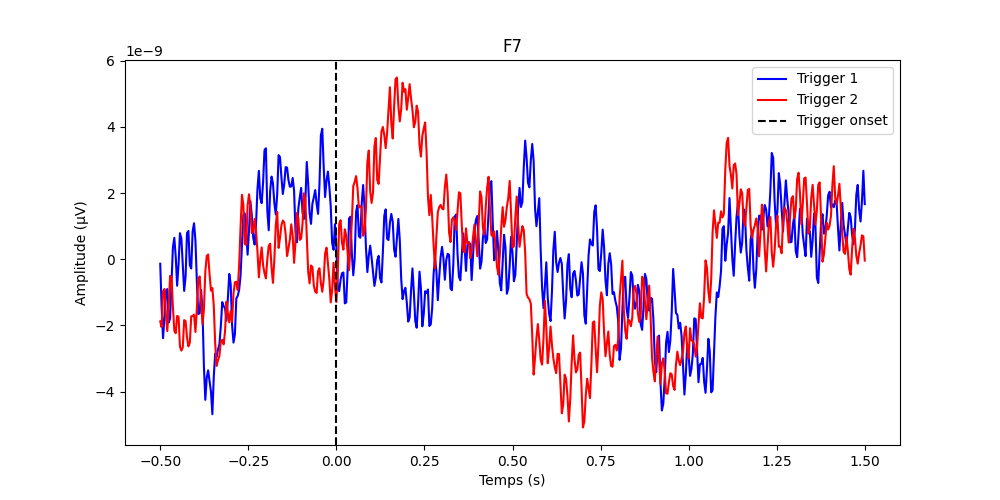

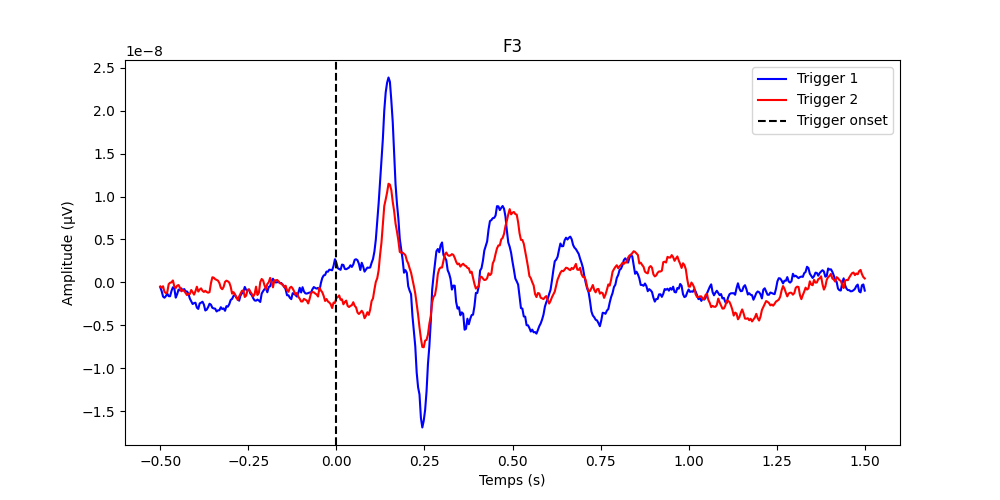

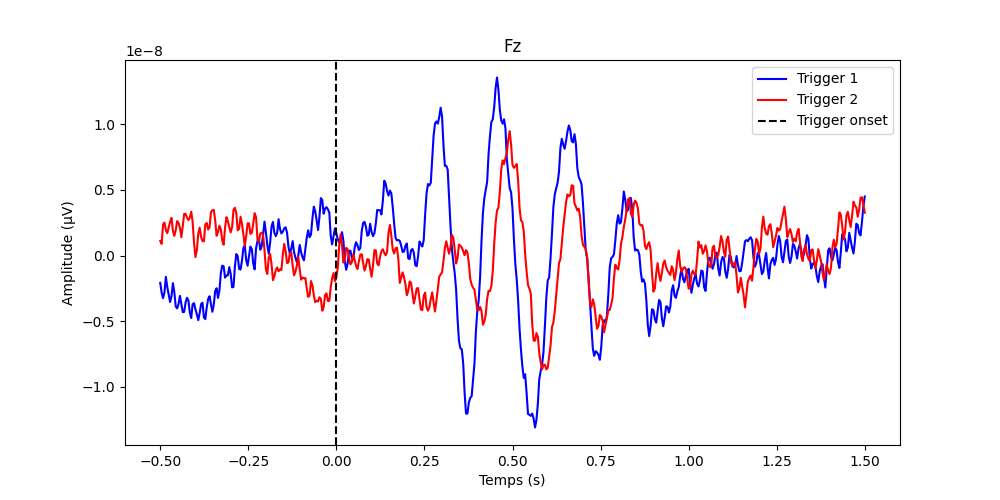

...

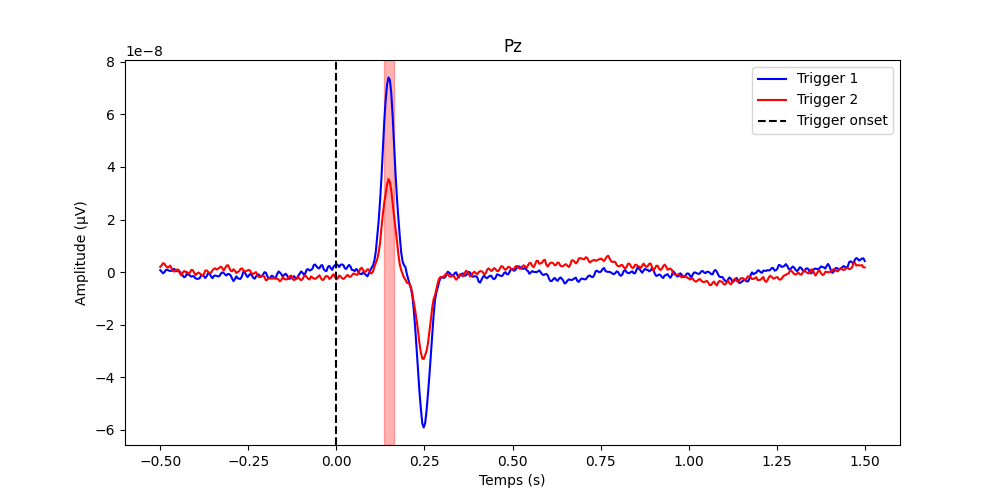

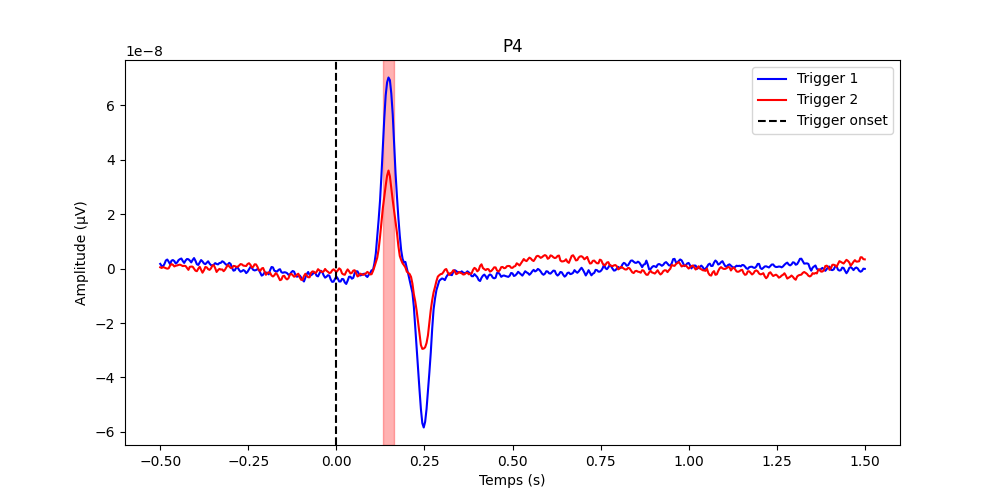

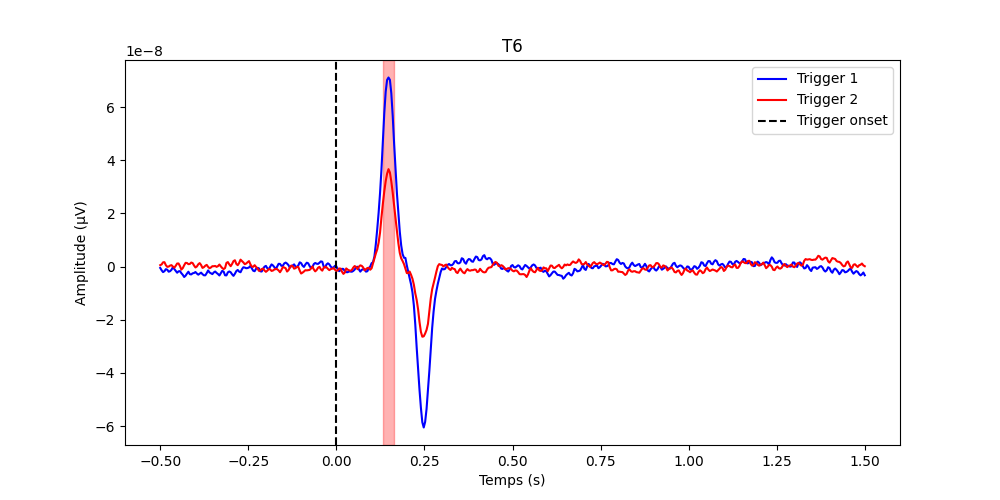

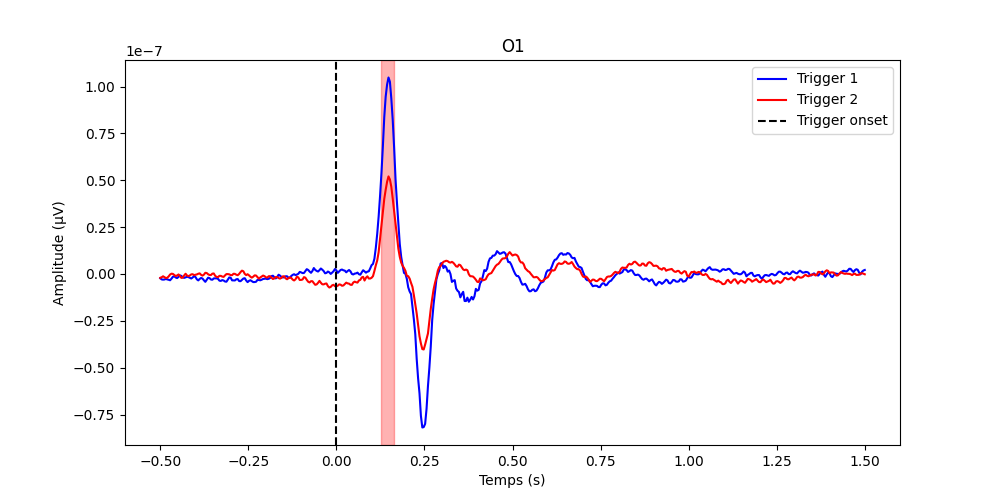

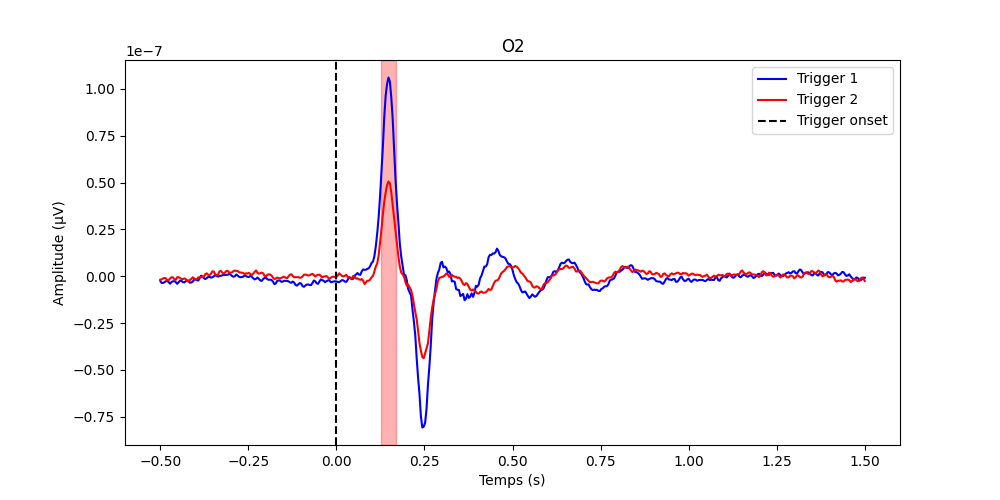

In [65]:
for ch_i, ch in enumerate(channels):

    # Tracer la différence ERP sur un canal
    times = erp_1.times
    fig, ax = plt.subplots(figsize=(10, 5))
    ax.plot(times, erp_1.data[ch_i], label="Trigger 1", color='blue')
    ax.plot(times, erp_2.data[ch_i], label="Trigger 2", color='red')
    ax.axvline(0, linestyle="--", color="black", label="Trigger onset")

    for i_c, c in enumerate(perm_stats[ch][1]):
        c = c[0]
        if perm_stats[ch][2][i_c] <= 0.05:
            h = ax.axvspan(times[c.start], times[c.stop - 1], color="r", alpha=0.3)
        # else:
            # ax.axvspan(times[c.start], times[c.stop - 1], color=(0.3, 0.3, 0.3), alpha=0.3)

    plt.legend()
    plt.title(f"{ch}")
    plt.xlabel("Temps (s)")
    plt.ylabel("Amplitude (µV)")
    plt.show(block=True)

### topoplot

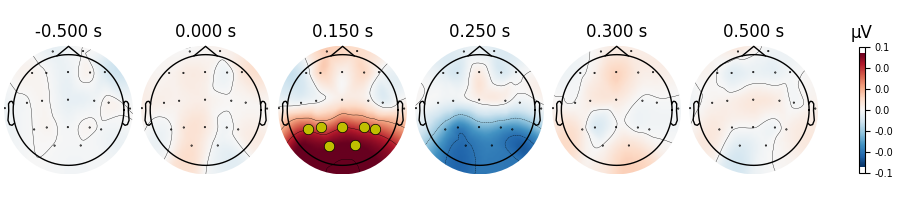

In [66]:
erp_diff = mne.combine_evoked([erp_1, erp_2], weights=[1, -1])

time_plot = [-0.5, 0, 0.150, 0.250, 0.3, 0.5]

mask_params = dict(markersize=15, markerfacecolor='y')
erp_diff.plot_topomap(times=time_plot, show=False, mask=stats_vec, mask_params=mask_params)
plt.show(block=True)

## TF analysis

In [67]:
trig = 1
events = np.column_stack((trig_idxs[trig_type == trig], np.zeros(len(trig_idxs[trig_type == trig]), dtype=int), trig_type[trig_type == trig]))
epochs_1 = mne.Epochs(raw, events, tmin=-0.5, tmax=1.5, baseline=None, detrend=1, preload=True)
erp_1 = epochs_1.average()

trig = 2
events = np.column_stack((trig_idxs[trig_type == trig], np.zeros(len(trig_idxs[trig_type == trig]), dtype=int), trig_type[trig_type == trig]))
epochs_2 = mne.Epochs(raw, events, tmin=-0.5, tmax=1.5, baseline=None, detrend=1, preload=True)
erp_2 = epochs_2.average()

decim = 2
freqs = np.arange(4, 120, 2)  # define frequencies of interest
n_cycles = np.linspace(4, 21, freqs.size)
tfr_kwargs = dict(
    method="morlet",
    freqs=freqs,
    n_cycles=n_cycles,
    decim=decim,
    return_itc=False,
    average=False,
)

tfr_epochs_1 = epochs_1.compute_tfr(**tfr_kwargs)
tfr_epochs_2 = epochs_2.compute_tfr(**tfr_kwargs)

tfr_epochs_1.apply_baseline(mode="ratio", baseline=(None, 0))
tfr_epochs_2.apply_baseline(mode="ratio", baseline=(None, 0))

Not setting metadata
200 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 200 events and 501 original time points ...
0 bad epochs dropped
Not setting metadata
200 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 200 events and 501 original time points ...
0 bad epochs dropped


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    4.6s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    5.0s


Applying baseline correction (mode: ratio)
Applying baseline correction (mode: ratio)


Data type,Power Estimates
Data source,Epochs
Number of epochs,200
Dims,"epoch, channel, freq, time"
Estimation method,morlet
Number of channels,21
Number of timepoints,251
Number of frequency bins,58
Frequency range,4.00 – 118.00 Hz


### plot + stats

stat_fun(H1): min=-3.3708789327865896 max=9.481078418989538
Running initial clustering …
Found 2 clusters


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

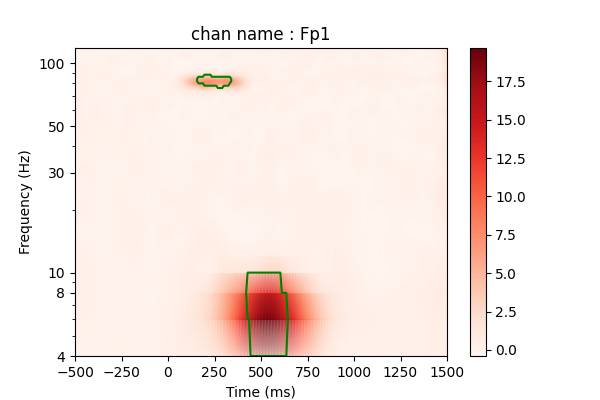

stat_fun(H1): min=-3.7866558822574214 max=10.49480191006567
Running initial clustering …
Found 3 clusters


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

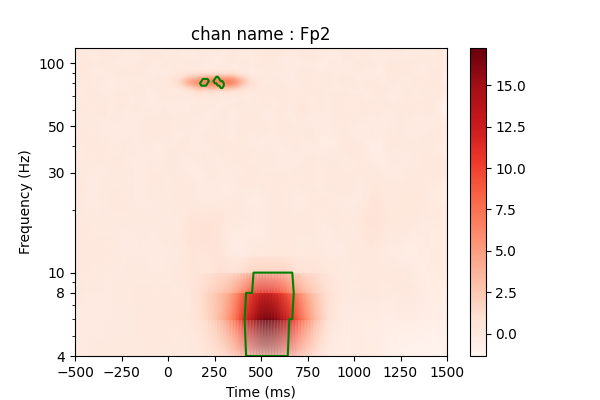

stat_fun(H1): min=-3.1867285730388235 max=3.2969225495471295
Running initial clustering …
Found 0 clusters


C:\Users\jules\AppData\Local\Temp\ipykernel_22752\3433839879.py:6: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  F_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_1samp_test(


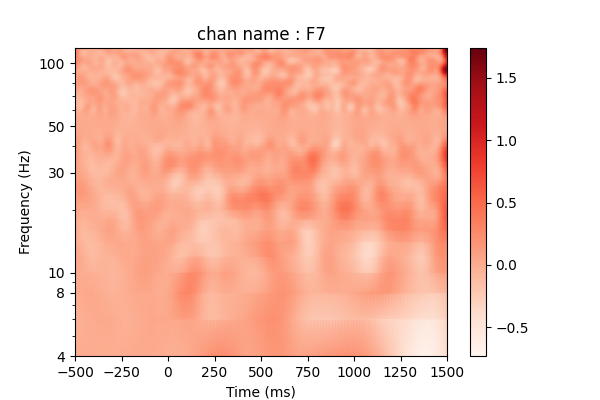

stat_fun(H1): min=-2.9085430952846973 max=9.21438767253464
Running initial clustering …
Found 2 clusters


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

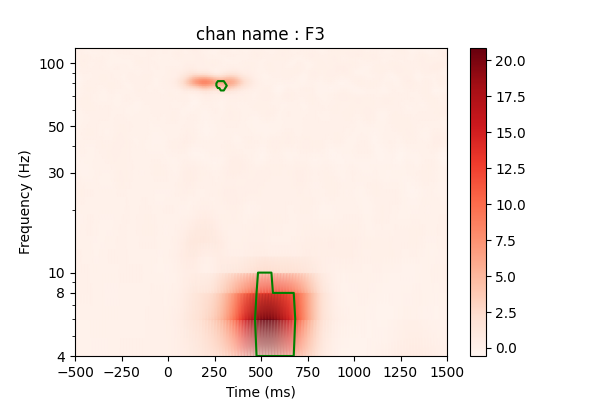

stat_fun(H1): min=-3.999211032549883 max=9.657294078825677
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

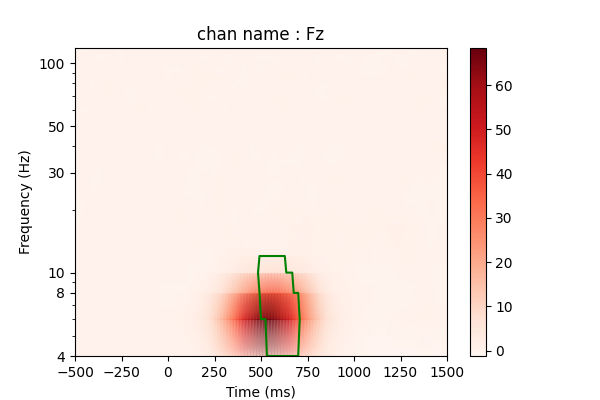

stat_fun(H1): min=-3.703698564772353 max=9.980106549548877
Running initial clustering …
Found 2 clusters


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

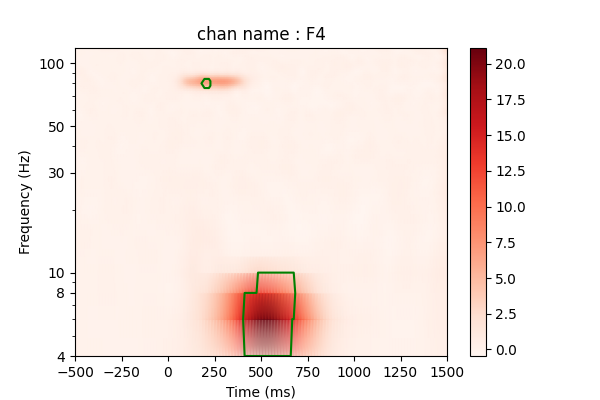

stat_fun(H1): min=-3.3244955539655243 max=3.511813182851836
Running initial clustering …
Found 0 clusters


C:\Users\jules\AppData\Local\Temp\ipykernel_22752\3433839879.py:6: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  F_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_1samp_test(


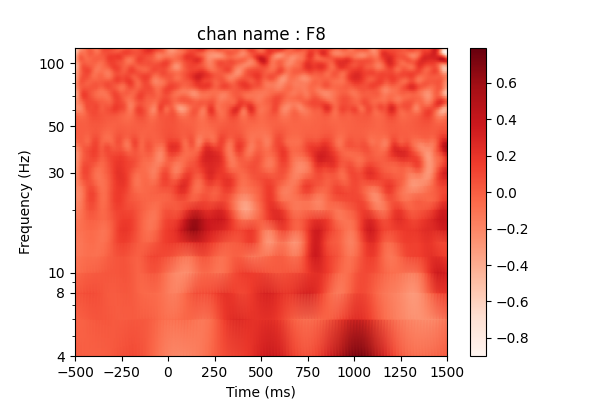

stat_fun(H1): min=-3.537719260181657 max=3.7912594170076597
Running initial clustering …
Found 0 clusters


C:\Users\jules\AppData\Local\Temp\ipykernel_22752\3433839879.py:6: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  F_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_1samp_test(


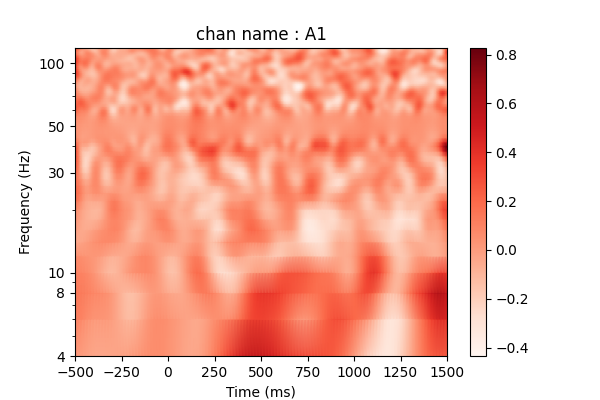

stat_fun(H1): min=-3.63095709341505 max=3.968950555245328
Running initial clustering …
Found 0 clusters


C:\Users\jules\AppData\Local\Temp\ipykernel_22752\3433839879.py:6: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  F_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_1samp_test(


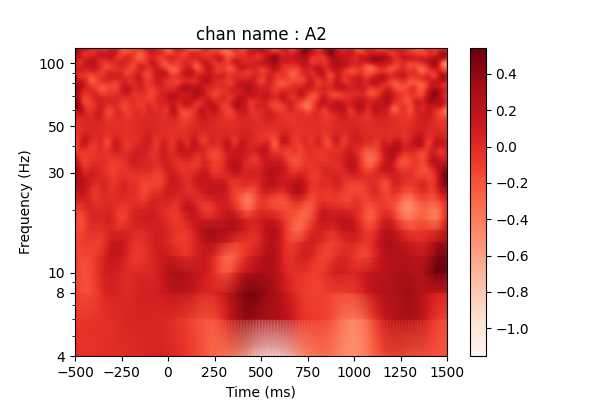

stat_fun(H1): min=-4.0788549954636135 max=3.1147203017865737
Running initial clustering …
Found 0 clusters


C:\Users\jules\AppData\Local\Temp\ipykernel_22752\3433839879.py:6: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  F_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_1samp_test(


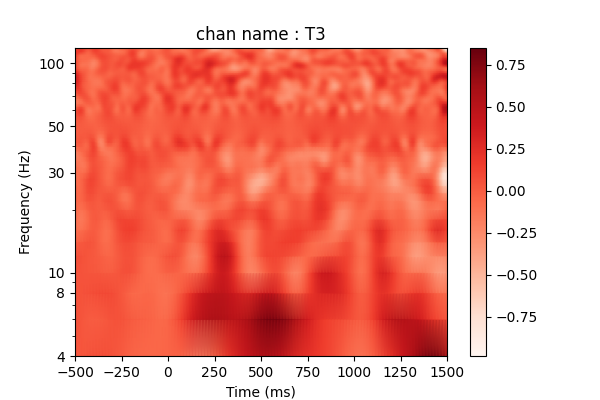

stat_fun(H1): min=-3.918904040575475 max=3.6934904040282723
Running initial clustering …
Found 0 clusters


C:\Users\jules\AppData\Local\Temp\ipykernel_22752\3433839879.py:6: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  F_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_1samp_test(


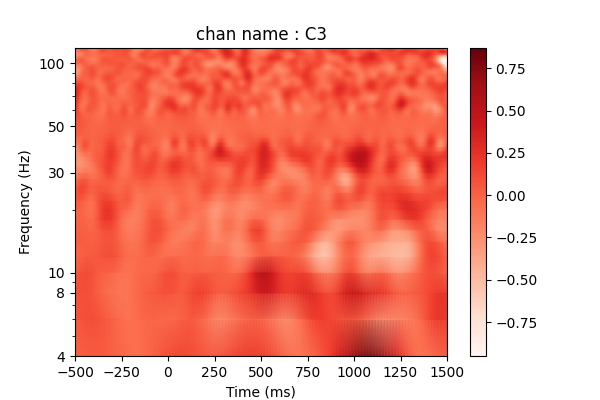

stat_fun(H1): min=-2.9115146137449233 max=4.024223108442257
Running initial clustering …
Found 0 clusters


C:\Users\jules\AppData\Local\Temp\ipykernel_22752\3433839879.py:6: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  F_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_1samp_test(


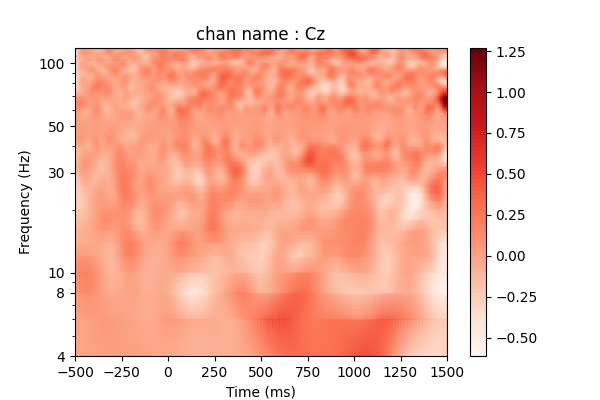

stat_fun(H1): min=-4.057936496591648 max=3.130375692249631
Running initial clustering …
Found 0 clusters


C:\Users\jules\AppData\Local\Temp\ipykernel_22752\3433839879.py:6: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  F_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_1samp_test(


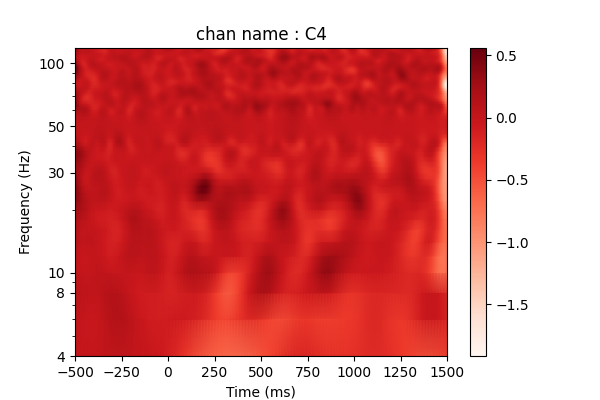

stat_fun(H1): min=-3.648150743254492 max=3.738538996792357
Running initial clustering …
Found 0 clusters


C:\Users\jules\AppData\Local\Temp\ipykernel_22752\3433839879.py:6: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  F_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_1samp_test(


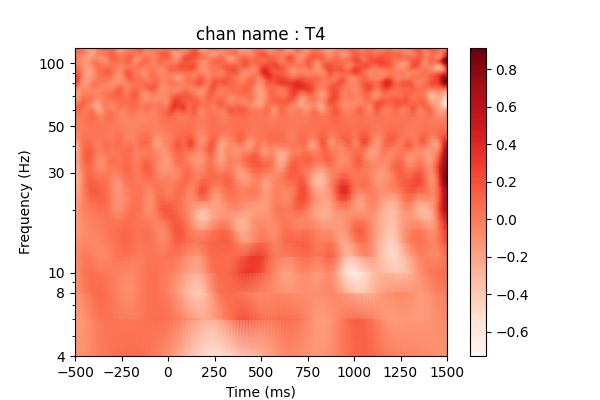

stat_fun(H1): min=-4.370557732749408 max=13.145286127631012
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

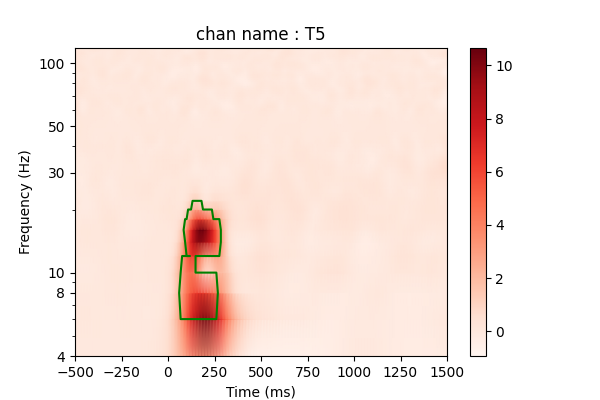

stat_fun(H1): min=-3.4503850395097038 max=12.398796533614478
Running initial clustering …
Found 2 clusters


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

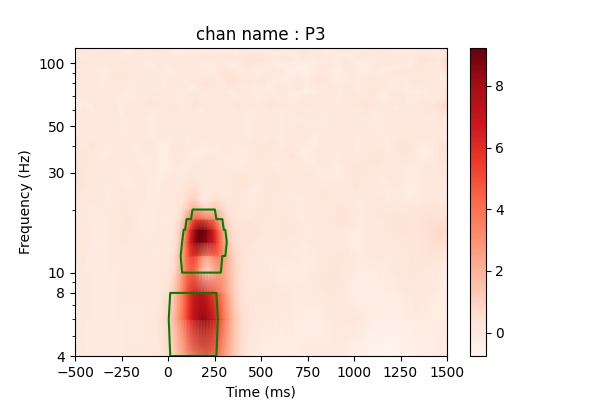

stat_fun(H1): min=-3.4219911153686904 max=10.477219478231362
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

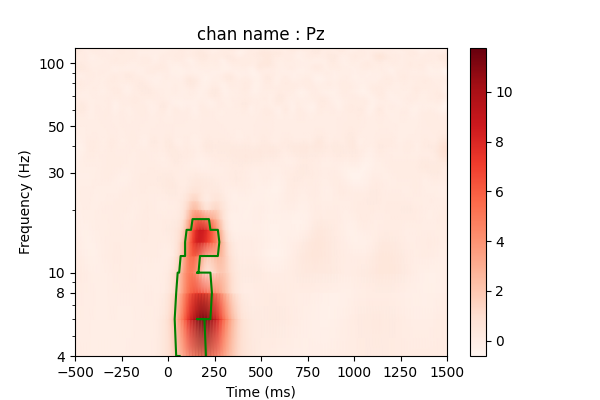

stat_fun(H1): min=-3.472122852674792 max=11.224708682973588
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

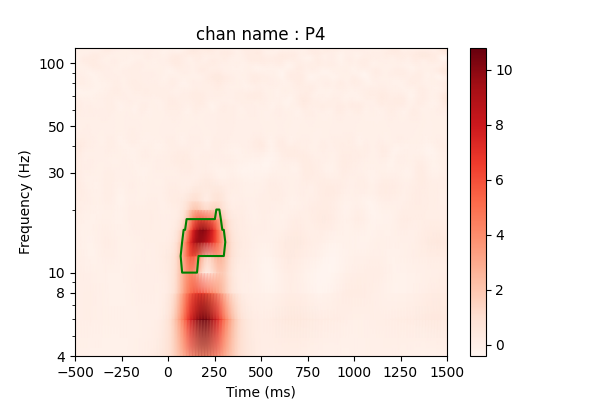

stat_fun(H1): min=-4.219116141585422 max=14.409489865115132
Running initial clustering …
Found 1 cluster


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

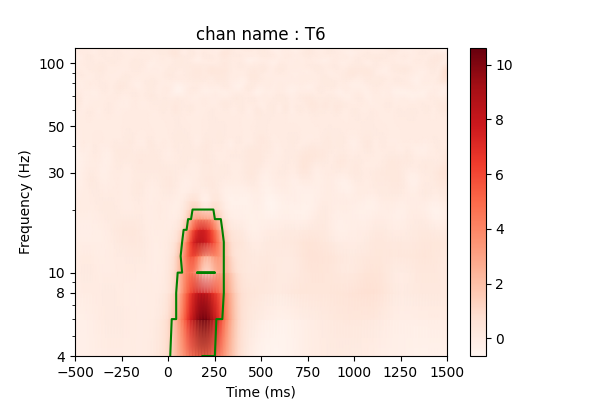

stat_fun(H1): min=-4.30220189909074 max=16.732092318271306
Running initial clustering …
Found 2 clusters


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

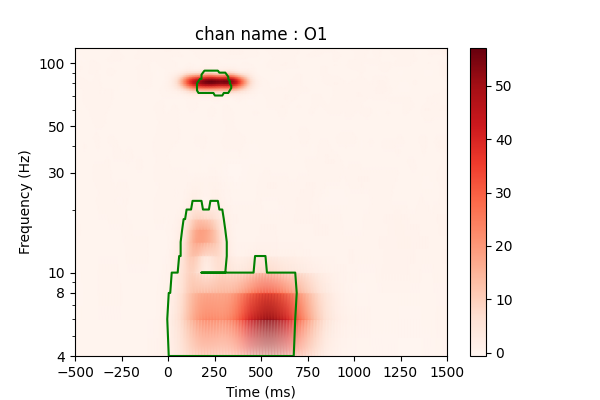

stat_fun(H1): min=-4.427883568890579 max=13.433130234836758
Running initial clustering …
Found 2 clusters


  0%|          | Permuting : 0/249 [00:00<?,       ?it/s]

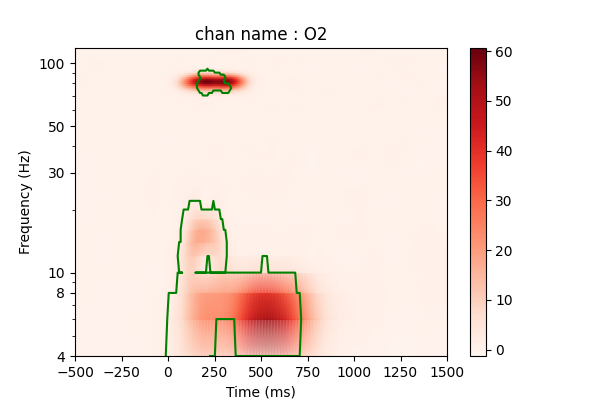

In [68]:
for ch_i, ch in enumerate(channels):

    epochs_power_1 = tfr_epochs_1.data[:, ch_i, :, :]  # only 1 channel as 3D matrix
    epochs_power_2 = tfr_epochs_2.data[:, ch_i, :, :]  # only 1 channel as 3D matrix

    F_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_1samp_test(
        epochs_power_1-epochs_power_2,
        out_type="mask",
        n_permutations=n_perm,
        threshold=8,
        tail=0,
        seed=np.random.default_rng(seed=8675309))
    
    times = 1e3 * tfr_epochs_1.times  # change unit to ms

    # Compute the difference in evoked to determine which was greater since
    # we used a 1-way ANOVA which tested for a difference in population means
    evoked_power_1 = epochs_power_1.mean(axis=0)
    evoked_power_2 = epochs_power_2.mean(axis=0)
    evoked_power_contrast = evoked_power_1 - evoked_power_2

    # Create new stats image with only significant clusters
    F_obs_plot = np.zeros((F_obs.shape))
    for c, p_val in zip(clusters, cluster_p_values):
        if p_val <= 0.05:
            F_obs_plot[c] = True

    fig, ax = plt.subplots(figsize=(6, 4))

    im = ax.pcolormesh(times, freqs, evoked_power_contrast, shading='gouraud', cmap=plt.get_cmap('Reds'))

    ax.contour(times, freqs, F_obs_plot, levels=0, colors='g')

    ax.set_xlabel("Time (ms)")
    ax.set_ylabel("Frequency (Hz)")
    ax.set_title(f"chan name : {ch}")

    ax.set_yscale('log')

    ax.set_yticks([4,8,10,30,50,100,120], labels=[4,8,10,30,50,100,120])
    ax.set_ylim(freqs[0], freqs[-1])

    fig.colorbar(im, ax=ax)

    plt.show(block=True)